# Puff/BioPUFF on top of BS Hindcast

Data provided by Wei Cheng 

In [1]:
from erddapy import ERDDAP
import pandas as pd
import datetime
from dateutil import tz
import xarray as xa
import numpy as np

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

def make_map(projection=ccrs.PlateCarree()):
    fig, ax = plt.subplots(figsize=(18,12),
                           subplot_kw=dict(projection=projection))
    if projection == ccrs.PlateCarree():
        gl = ax.gridlines(draw_labels=True)
        gl.xlabels_top = gl.ylabels_right = False
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
    return fig, ax

## Ingest Hindcast data from W.Cheng

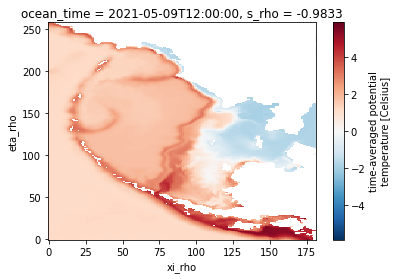

In [2]:
file = '/Users/bell/in_and_outbox/2021/cheng/B10K-K20_CORECFS_2020-2024_average_temp.nc'

xdf = xa.open_dataset(file)

xdf_rho0 = xdf.isel(s_rho=slice(0,1))

sample = xdf_rho0.sel(ocean_time=slice('2021-5-1','2021-5-10')).temp.plot()
sample

## Load bottom temps from puffs at boundaryies specified by model - model date is end of 7day average on model time?

### Bottom Temp Timeseries (look for deep depths)

In [3]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

server_url = 'http://ecofoci-field.pmel.noaa.gov:8080/erddap'

e = ERDDAP(server=server_url)
dfname = pd.read_csv(e.get_search_url(response='csv', search_for=f'20BSP'))

dfs = {}
for dataset in sorted(dfname['Dataset ID'].values):
    if 'bottom' in dataset:
        d = ERDDAP(server=server_url,
                   protocol='tabledap',
                   response='csv',
                  )

        d.dataset_id=dataset

        df = d.to_pandas(
            index_col='time (UTC)',
            parse_dates=True,
            skiprows=(1,)  # units information can be dropped.
        )

        df.sort_index(inplace=True)
        df.columns = [x[1].split()[0] for x in enumerate(df.columns)]
        
        #manually trim deployments to omit ship 
        start_dates = {
            '300434063863550':datetime.datetime(2020,10,11,0,0,0),
            '300434063663610':datetime.datetime(2020,9,19,0,0,0),
            '300434063472030':datetime.datetime(2020,9,15,0,0,0),
            '300434063477030':datetime.datetime(2020,7,22,0,0,0),
            '300434063471670':datetime.datetime(2020,8,21,0,0,0),
            '300434063473020':datetime.datetime(2020,8,14,0,0,0),
            '300434063764860':datetime.datetime(2020,9,19,0,0,0),
            '300434063471680':datetime.datetime(2020,9,5,0,0,0),
            '300434063472040':datetime.datetime(2020,9,5,0,0,0),
            '300434063471040':datetime.datetime(2020,9,20,0,0,0),
            '300434063862560':datetime.datetime(2020,9,2,0,0,0),
            '300434063863350':datetime.datetime(2020,10,30,0,0,0),
            '300434063472010':datetime.datetime(2020,10,16,0,0,0)
        }
        print(dataset.split('_')[2],start_dates[dataset.split('_')[2]])
        dft = df[start_dates[dataset.split('_')[2]]:datetime.date(2021,9,15)]
        
        dfs.update({dataset:dft})

300434063471040 2020-09-20 00:00:00
300434063471670 2020-08-21 00:00:00
300434063472010 2020-10-16 00:00:00
300434063472040 2020-09-05 00:00:00
300434063473020 2020-08-14 00:00:00
300434063663610 2020-09-19 00:00:00
300434063764860 2020-09-19 00:00:00
300434063862560 2020-09-02 00:00:00
300434063863350 2020-10-30 00:00:00
300434063863550 2020-10-11 00:00:00


In [4]:
server_url = 'http://ecofoci-field.pmel.noaa.gov:8080/erddap'

e = ERDDAP(server=server_url)
dfname = pd.read_csv(e.get_search_url(response='csv', search_for=f'_POPS0 _bottom'))

df_all = {}
for dataset in sorted(dfname['Dataset ID'].values):
    print(dataset)

    d = ERDDAP(server=server_url,
               protocol='tabledap',
               response='csv',
              )

    d.dataset_id=dataset

    pdf = d.to_pandas(
        index_col='time (UTC)',
        parse_dates=True,
        skiprows=(1,)  # units information can be dropped.
    )

    pops_deploy = {
        '0001':[58.9931667,-175.00267],
        '0002':[55.442,-163.74017],
        '0004':[59.69,-176.705],
        '0005':[56.4471667,-168.49617],
        '0006':[56.7043333,-171.2195],
        '0007':[61.0698333,-177.773],
        '0008':[59.243995,-169.41832],
        '0009':[60.7788333,-174.49733],
        '0010':[55.2358333,-166.12983]
    }

    df_all.update({dataset:pdf})

2021_SpringDeployed_BS_BioPUFFS_POPS0001_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0002_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0004_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0005_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0006_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0007_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0008_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0009_bottomdata
2021_SpringDeployed_BS_BioPUFFS_POPS0010_bottomdata


Merge all data (puffs and biopuffs) and then split on weeks... we will take these groupings to plot colored circles over the season for a giv

In [5]:
df_all_merged=pd.DataFrame()
for dataset_id in df_all.keys():
    df_all_merged = df_all_merged.append(df_all[dataset_id])

In [6]:
df_all_merged.rename(columns={'Temp_DegC_0':'fr_temp','Temp_DegC_1':'sr_temp','Pressure_Bar':'pressure','latitude (degrees_north)':'latitude','longitude (degrees_east)':'longitude'}, inplace=True)

In [7]:
df_merged=pd.DataFrame()
for dataset_id in dfs.keys():
    df_merged = df_merged.append(dfs[dataset_id])
#merge biopuffs
df_merged = df_merged.append(df_all_merged)
    
#break out times and drop duplicates keeping the last value (which should be from the preliminary file not final if necessary)
df_merged['year']=df_merged.index.year
df_merged['doy']=df_merged.index.dayofyear
df_merged['time']=df_merged.index.hour
df_merged['weeks']=df_merged.index.isocalendar().week
df_merged.drop_duplicates(keep='last',inplace=True)


***alignment of timestamps***
- hindcast marks the time at the end of the 7 day average
- fairly similar to the isocalender.weeks() function


In [8]:
weeklygroupbed = df_merged[df_merged.year==2020].groupby('weeks')
weeklygroupbed.groups[39]

DatetimeIndex(['2020-09-21 00:00:00+00:00', '2020-09-21 01:00:00+00:00',
               '2020-09-21 02:00:00+00:00', '2020-09-21 03:00:00+00:00',
               '2020-09-21 04:00:00+00:00', '2020-09-21 05:00:00+00:00',
               '2020-09-21 06:00:00+00:00', '2020-09-21 07:00:00+00:00',
               '2020-09-21 08:00:00+00:00', '2020-09-21 09:00:00+00:00',
               ...
               '2020-09-27 14:00:00+00:00', '2020-09-27 15:00:00+00:00',
               '2020-09-27 16:00:00+00:00', '2020-09-27 17:00:00+00:00',
               '2020-09-27 18:00:00+00:00', '2020-09-27 19:00:00+00:00',
               '2020-09-27 20:00:00+00:00', '2020-09-27 21:00:00+00:00',
               '2020-09-27 22:00:00+00:00', '2020-09-27 23:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='time (UTC)', length=504, freq=None)

In [9]:
xdf_rho0.isel(ocean_time=slice(38,39))

<xarray.Dataset>
Dimensions:     (s_rho: 1, ocean_time: 1, eta_rho: 258, xi_rho: 182)
Coordinates:
  * ocean_time  (ocean_time) datetime64[ns] 2020-09-27T12:00:00
  * s_rho       (s_rho) float64 -0.9833
    lat_rho     (eta_rho, xi_rho) float64 ...
    lon_rho     (eta_rho, xi_rho) float64 ...
Dimensions without coordinates: eta_rho, xi_rho
Data variables:
    Cs_r        (s_rho) float64 ...
    hc          float64 ...
    temp        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    zeta        (ocean_time, eta_rho, xi_rho) float32 ...
Attributes: (12/44)
    file:                       ./Out/delta_66_avg_00262.nc\n./Out/delta_66_a...
    format:                     netCDF-3 classic file
    Conventions:                CF-1.0
    type:                       ROMS/TOMS averages file
    title:                      Bering Sea 10 km Grid
    var_info:                   /gscratch/bumblereem/bering10k/input/var/vari...
    ...                         ...
    history:                    Wed Aug 25 15:32:06 2021: Data traferred from...
    ana_file:                   ROMS/Functionals/ana_btflux.h, /gscratch/bumb...
    bio_file:                   ROMS/Nonlinear/bestnpz.h
    CPP_options:                NEP5, ADD_FSOBC, ADD_M2OBC, ANA_BIOLOGY, ANA_...
    NCO:                        4.6.9
    history_of_appended_files:  Wed Aug 25 15:31:39 2021: Appended file /gscr...

## Retrieve deepest prawler datapoint (and 19BS2c bottom point) to add

In [10]:
server_url = 'http://redwing.pmel.noaa.gov:8080/erddap'

d = ERDDAP(server=server_url,
           protocol='tabledap',
           response='csv',
          )

d.dataset_id='TELOM200_PRAWC_M200'

d.variables =  [
 'SB_Depth',
 'SB_Temp',
 'Optode_Temp',
 "time"
]


d.constraints = {
    'time>=': '2021-03-01T00:00:00Z',
    'time<=': '2022-01-01T00:00:00Z',
    'SB_Depth>=': 45
}

dfpr = d.to_pandas(
    index_col='time (UTC)',
    parse_dates=True,
    skiprows=(1,)  # units information can be dropped.
)

dfpr.sort_index(inplace=True)
dfpr.columns = [x[1].split()[0] for x in enumerate(dfpr.columns)]


<AxesSubplot:xlabel='time (UTC)'>

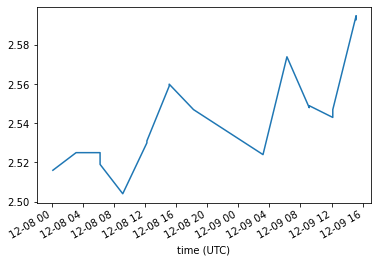

In [11]:
dfpr['weeks'] = dfpr.index.isocalendar().week

dfpr.SB_Temp.plot()
dfpr.SB_Temp.resample('7D').median().plot()

In [12]:
server_url = 'http://ecofoci-field.pmel.noaa.gov:8080/erddap'

d = ERDDAP(server=server_url,
           protocol='tabledap',
           response='csv',
          )

d.dataset_id='datasets_Mooring_19bs2c_final'

d.variables = [
    "timeseries_id",
    "temperature",
    "latitude",
    "longitude",
    "time",
]
               
dfm2 = d.to_pandas(
    index_col='time (UTC)',
    parse_dates=True,
    skiprows=(1,)  # units information can be dropped.
)

dfm2.sort_index(inplace=True)
dfm2.columns = [x[1].split()[0] for x in enumerate(dfm2.columns)]

In [13]:
dfm2.groupby('timeseries_id').groups.keys()

dict_keys(['19bs2c_eco_0011m', '19bs2c_eco_0044m', '19bs2c_s16_0066m', '19bs2c_s37_0030m', '19bs2c_s39_0018m', '19bs2c_s39_0026m', '19bs2c_s39_0034m', '19bs2c_s39_0039m', '19bs2c_s39_0049m', '19bs2c_s39_0059m', '19bs2c_s56_0011m', '19bs2c_s56_0044m'])

subset data for plotting on years and week no's

In [15]:
dfmg = dfm2.groupby('timeseries_id').get_group('19bs2c_s39_0059m')
dfmg['year'] = dfmg.index.year
dfmg['weeks'] = dfmg.index.isocalendar().week

dfmig = dfmg[dfmg.year==2020].groupby('weeks')


/var/folders/vv/blq095kj0xj9nz1v0ffdwfch0000gp/T/ipykernel_33028/2817994709.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmg['year'] = dfmg.index.year
/var/folders/vv/blq095kj0xj9nz1v0ffdwfch0000gp/T/ipykernel_33028/2817994709.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmg['weeks'] = dfmg.index.isocalendar().week


/var/folders/vv/blq095kj0xj9nz1v0ffdwfch0000gp/T/ipykernel_13363/1060784374.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(18,12),


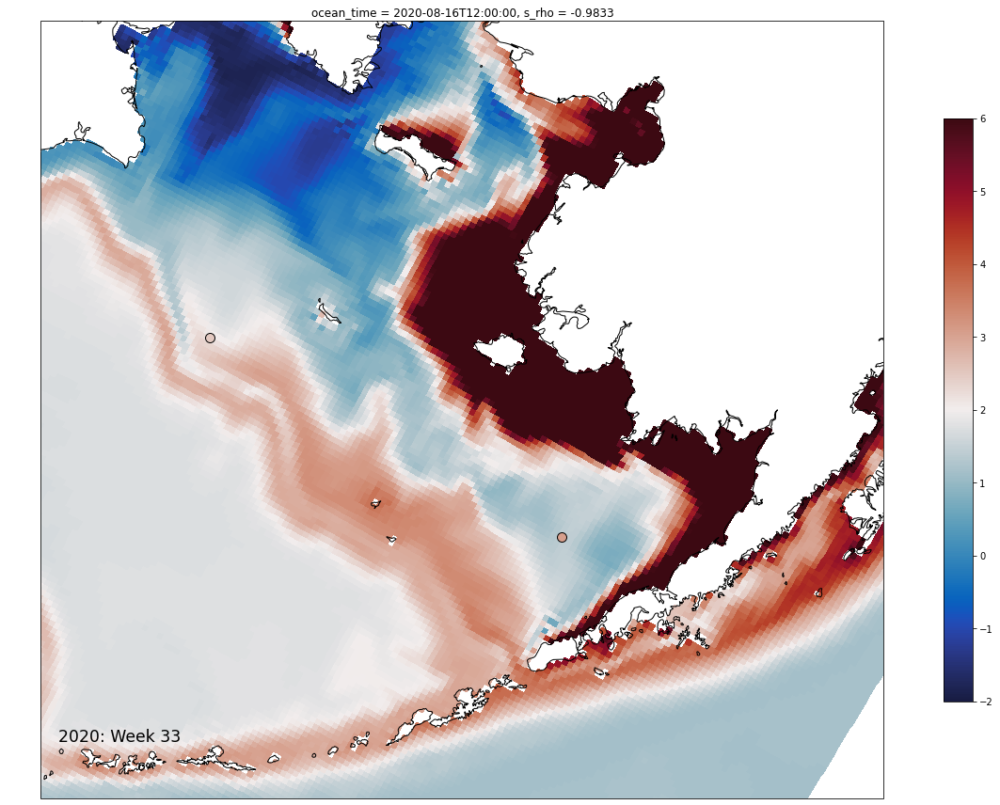

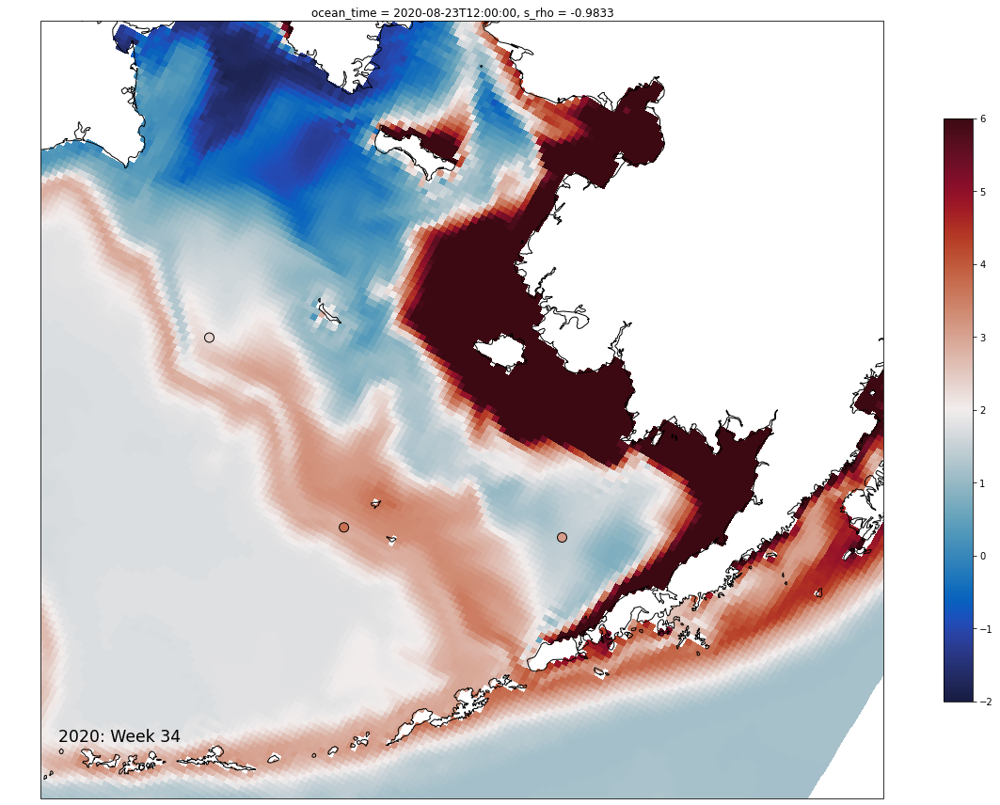

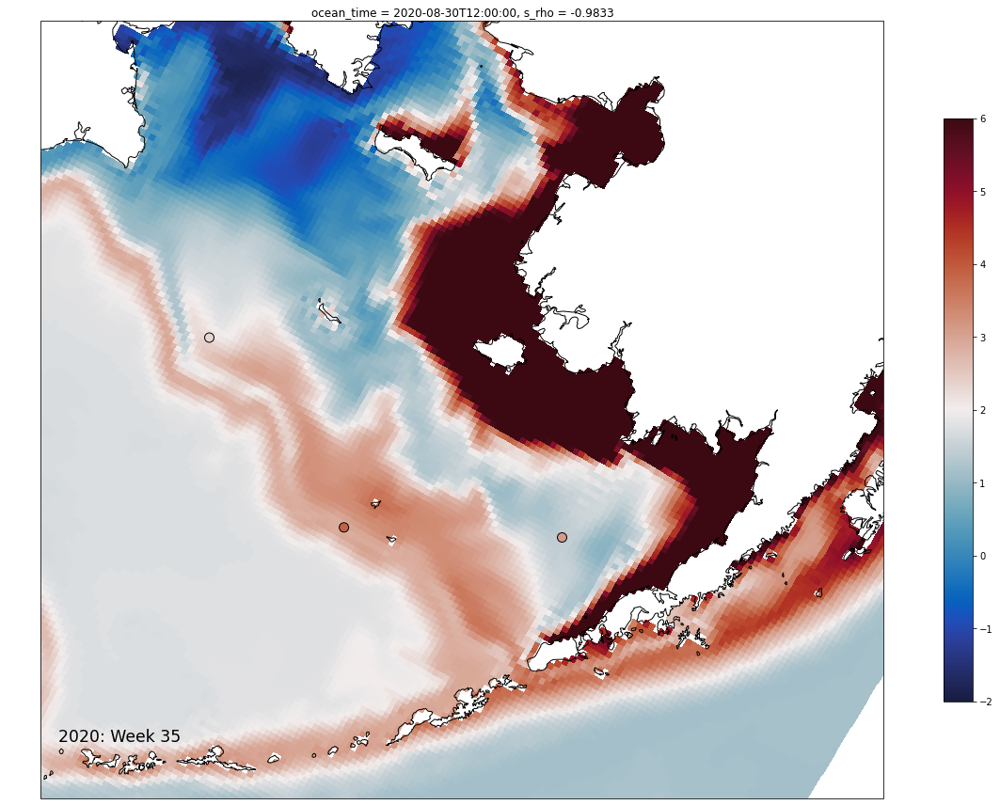

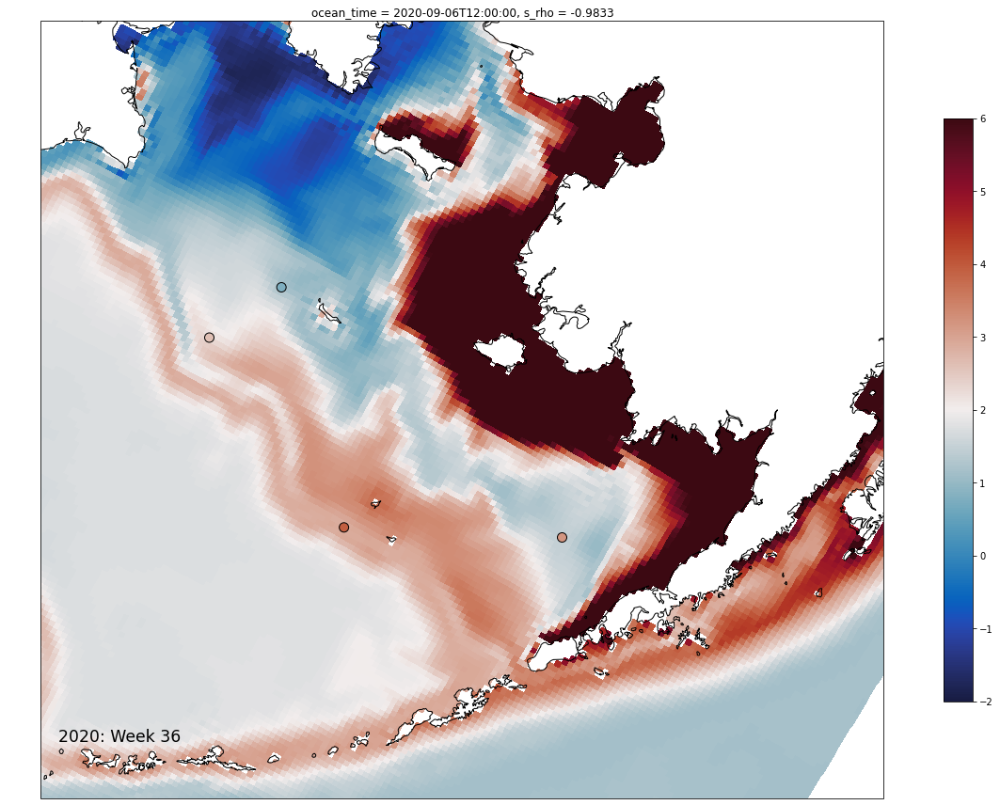

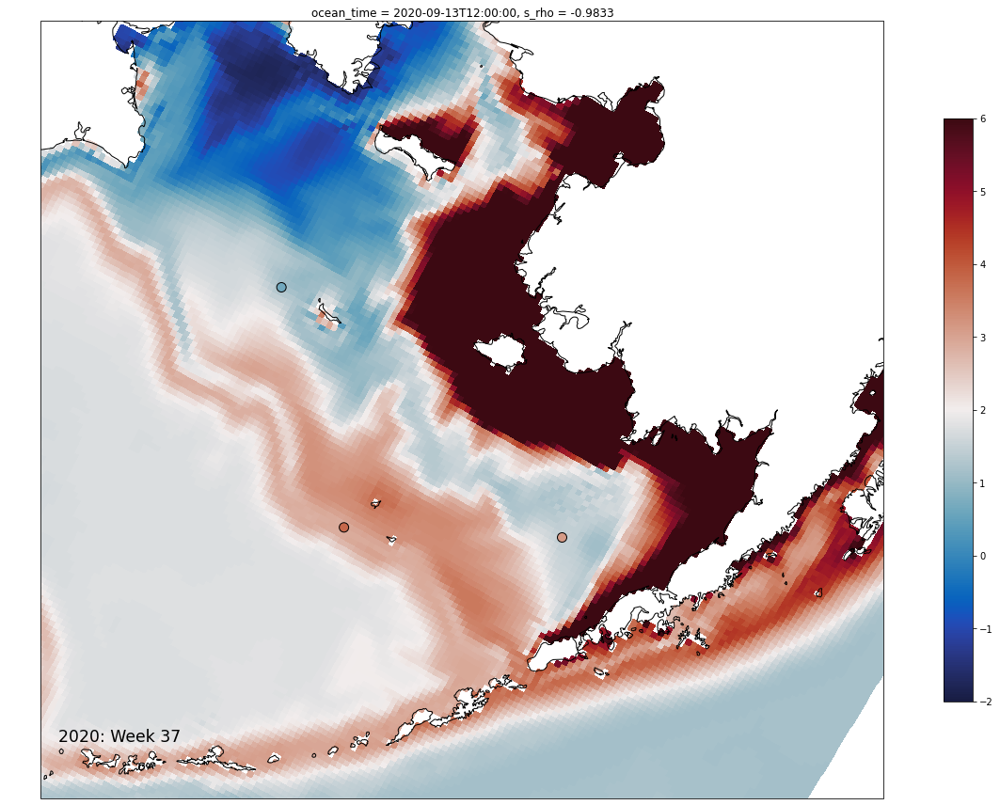

...

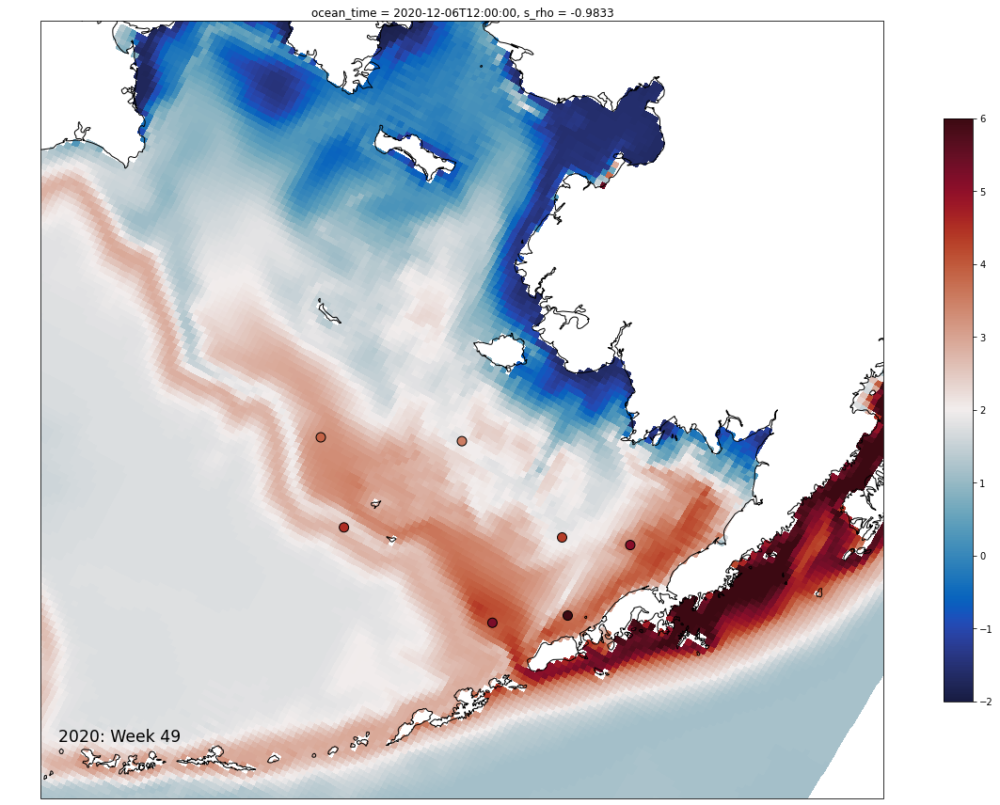

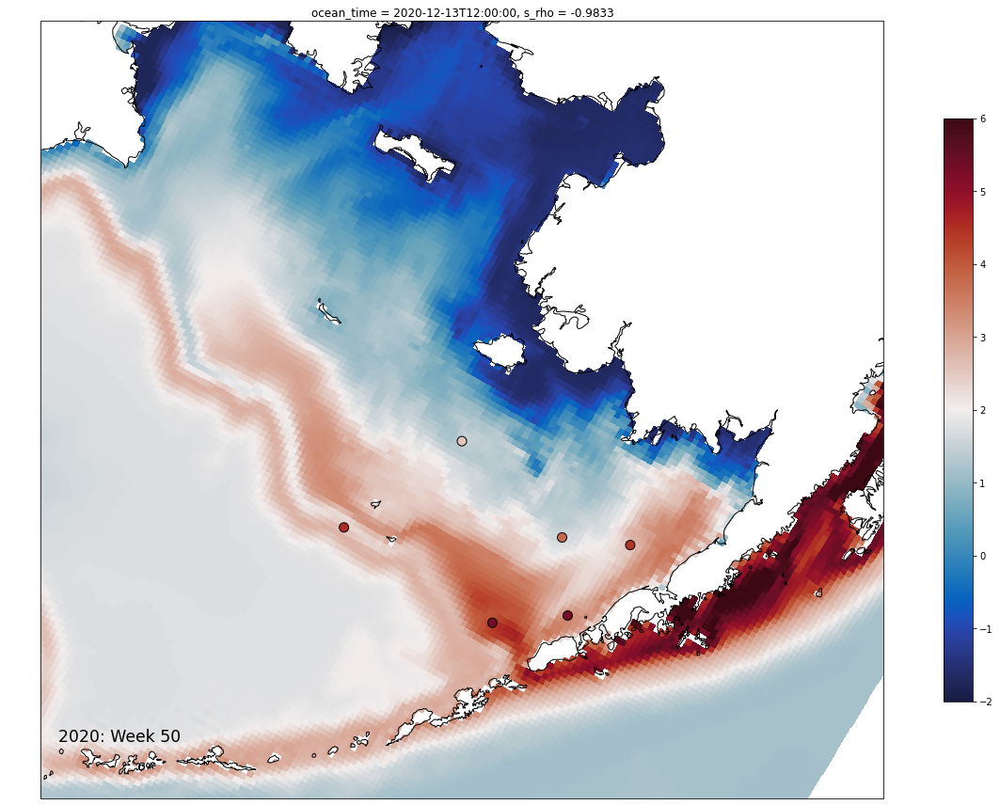

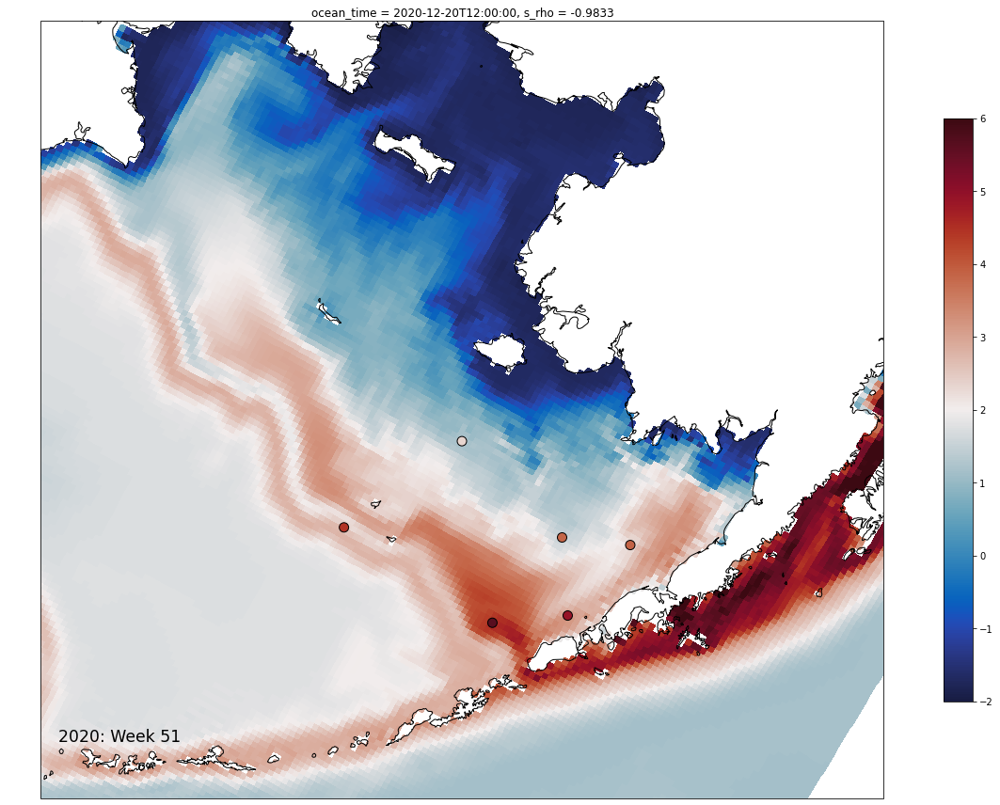

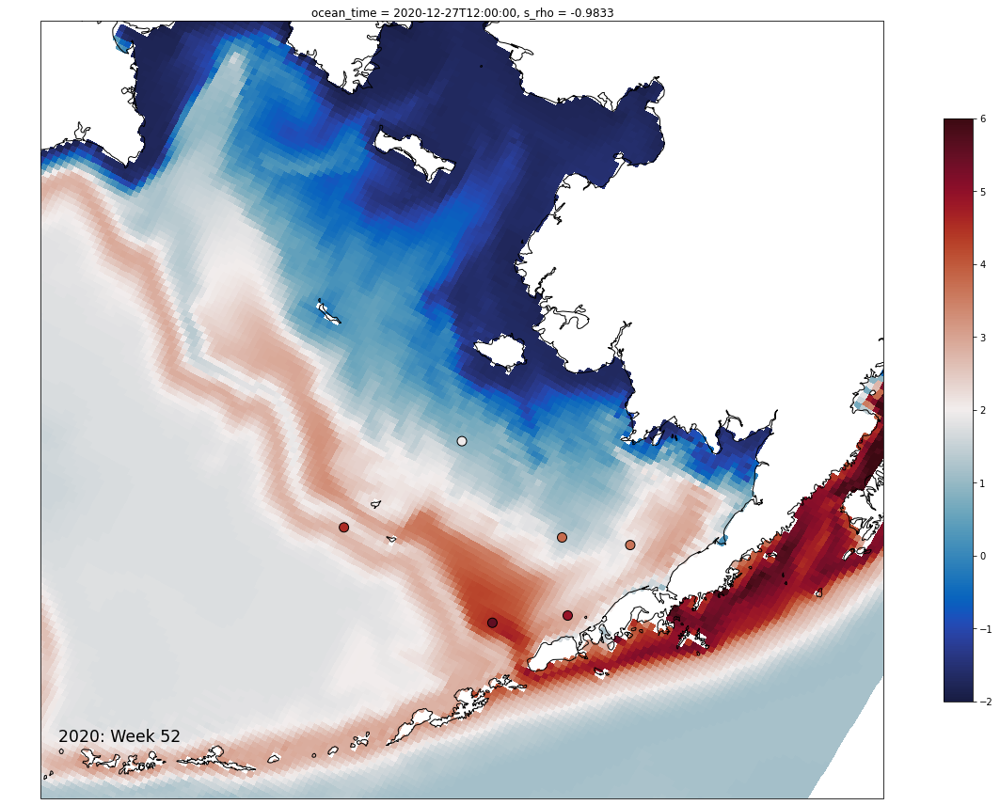

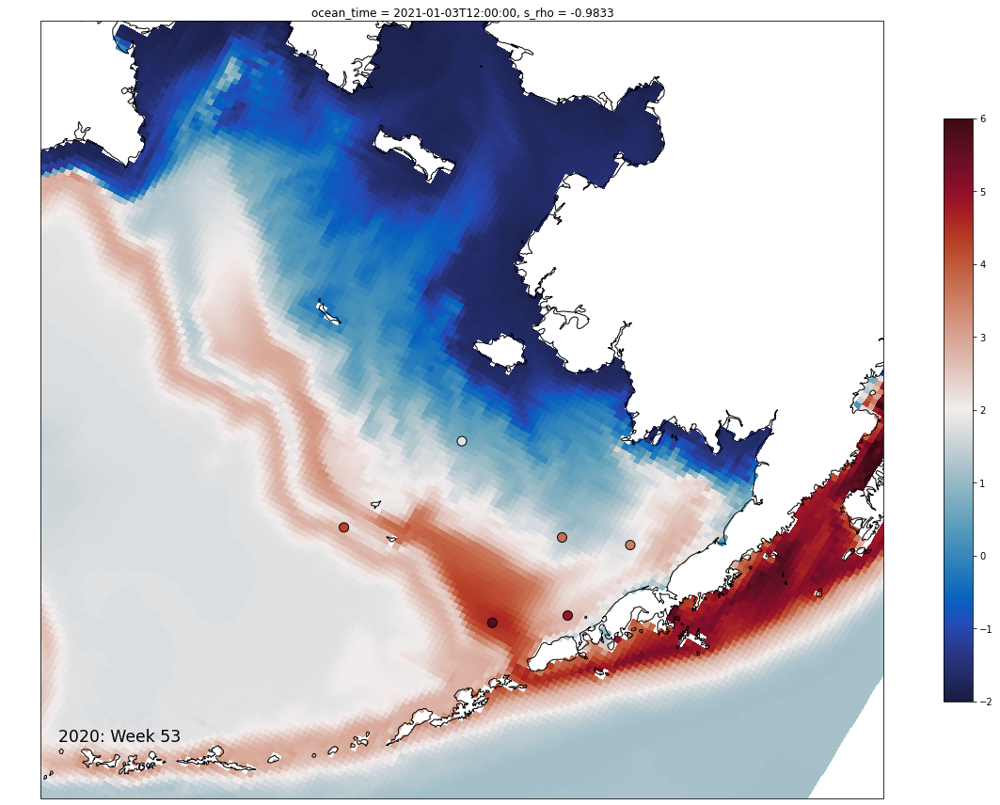

In [17]:
extent=[-179.5, -154, 52, 65]

map_proj = ccrs.LambertConformal(central_longitude=-160.0)
transformation=ccrs.PlateCarree()


for wn, dftemp in weeklygroupbed:
    
    ### due to the way its grouped, 53 is a incomplete picture
    
    fig,ax = make_map(projection=map_proj)
    
    hind = xdf_rho0.isel(ocean_time=slice(wn-1,wn))
    dfplot = dftemp.groupby('timeseries_id').median()


    p = hind.temp[0,0,:,:].plot(
        transform=ccrs.PlateCarree(),  # the data's projection
        subplot_kws={"projection": map_proj},
        vmin=-2,vmax=6,cmap=cmocean.cm.balance,
        x='lon_rho',y='lat_rho',
        add_colorbar=False
    )

    c = ax.scatter(dfplot.longitude, dfplot.latitude, s=100, c=dfplot.sr_temp, edgecolors='k',
                   cmap=cmocean.cm.balance, vmin=-2, vmax=6, 
                   label=('2020: Week '+str(wn)),
                   transform=transformation)

    ax.scatter(dfmig.get_group(wn).median().longitude, dfmig.get_group(wn).median().latitude, s=100, c=dfmig.get_group(wn).median().temperature, edgecolors='k',
                   cmap=cmocean.cm.balance, vmin=-2, vmax=6, 
                   transform=transformation)    
    
    plt.colorbar(p,shrink=.75)
    ax.coastlines("10m", color="k")
    ax.set_extent(extent)
    
    l = plt.legend(loc='lower left', bbox_to_anchor=(-0.05, 0.05), fontsize='xx-large', fancybox=True, frameon=False, markerscale=0)
    
    for text in l.get_texts():
        text.set_color("black")    
    
    fig.tight_layout()
    fig.savefig('Bio_PUFF_2020_week'+str(wn).zfill(2)+'.jpg',facecolor='white',dpi=300)

In [16]:
dfmig = dfmg[dfmg.year==2021].groupby('weeks')
dfprig = dfpr.groupby('weeks')

weeklygroupbed = df_merged[df_merged.year==2021].groupby('weeks')

In [17]:
xdf_rho0.isel(ocean_time=slice(52+16,53+17))

<xarray.Dataset>
Dimensions:     (s_rho: 1, ocean_time: 2, eta_rho: 258, xi_rho: 182)
Coordinates:
  * ocean_time  (ocean_time) datetime64[ns] 2021-04-25T12:00:00 2021-05-09T12...
  * s_rho       (s_rho) float64 -0.9833
    lat_rho     (eta_rho, xi_rho) float64 45.0 45.09 45.18 ... 69.46 69.56 69.66
    lon_rho     (eta_rho, xi_rho) float64 197.2 197.3 197.4 ... 156.5 156.4
Dimensions without coordinates: eta_rho, xi_rho
Data variables:
    Cs_r        (s_rho) float64 -0.9515
    hc          float64 10.0
    temp        (ocean_time, s_rho, eta_rho, xi_rho) float32 ...
    zeta        (ocean_time, eta_rho, xi_rho) float32 ...
Attributes: (12/44)
    file:                       ./Out/delta_66_avg_00262.nc\n./Out/delta_66_a...
    format:                     netCDF-3 classic file
    Conventions:                CF-1.0
    type:                       ROMS/TOMS averages file
    title:                      Bering Sea 10 km Grid
    var_info:                   /gscratch/bumblereem/bering10k/input/var/vari...
    ...                         ...
    history:                    Wed Aug 25 15:32:06 2021: Data traferred from...
    ana_file:                   ROMS/Functionals/ana_btflux.h, /gscratch/bumb...
    bio_file:                   ROMS/Nonlinear/bestnpz.h
    CPP_options:                NEP5, ADD_FSOBC, ADD_M2OBC, ANA_BIOLOGY, ANA_...
    NCO:                        4.6.9
    history_of_appended_files:  Wed Aug 25 15:31:39 2021: Appended file /gscr...

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
filling witn missing
17
18
19
20
21


/var/folders/vv/blq095kj0xj9nz1v0ffdwfch0000gp/T/ipykernel_5263/1060784374.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(18,12),


22
23
24
25
26
27
28
29
30
31
32
33


IndexError: index 0 is out of bounds for axis 0 with size 0

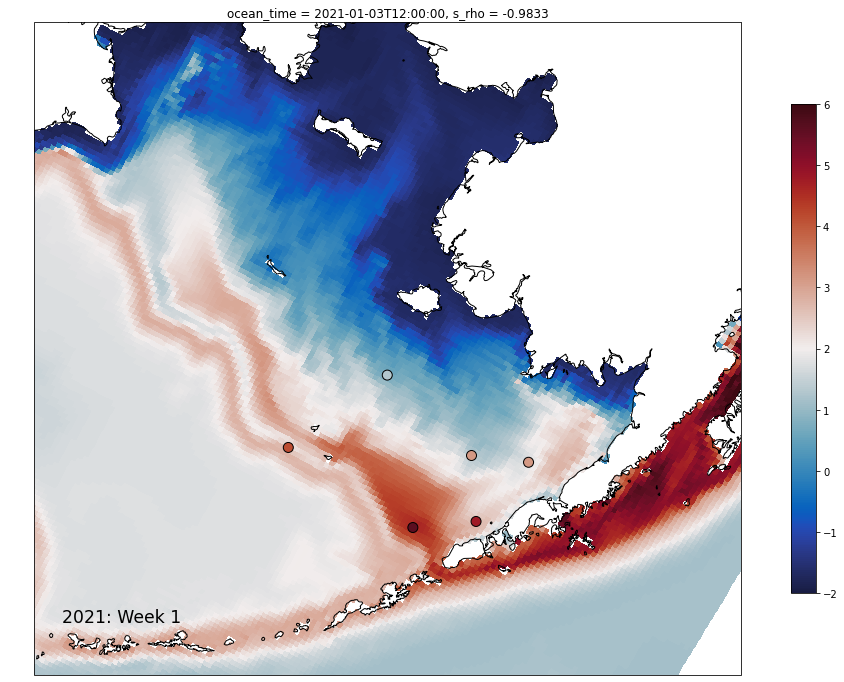

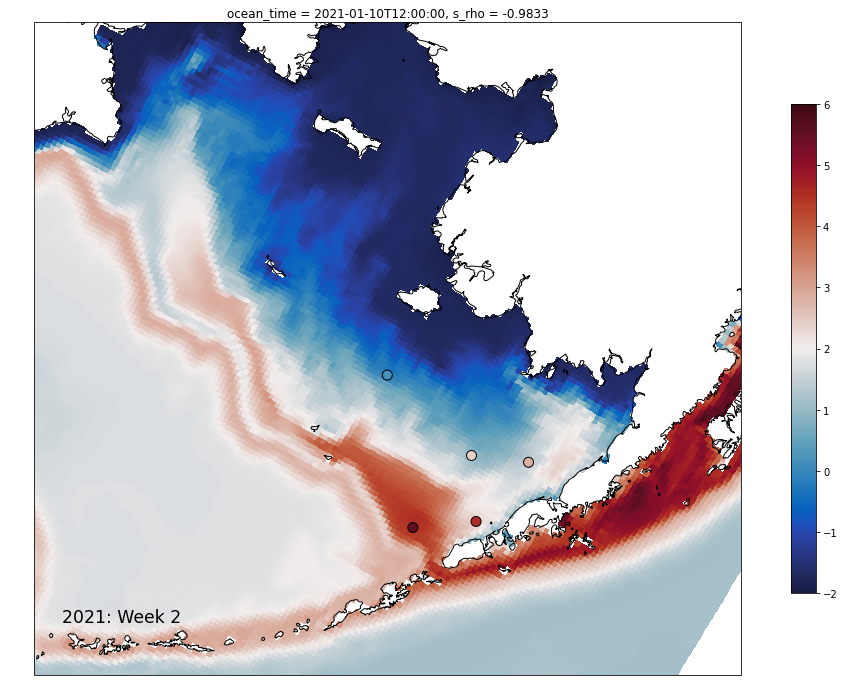

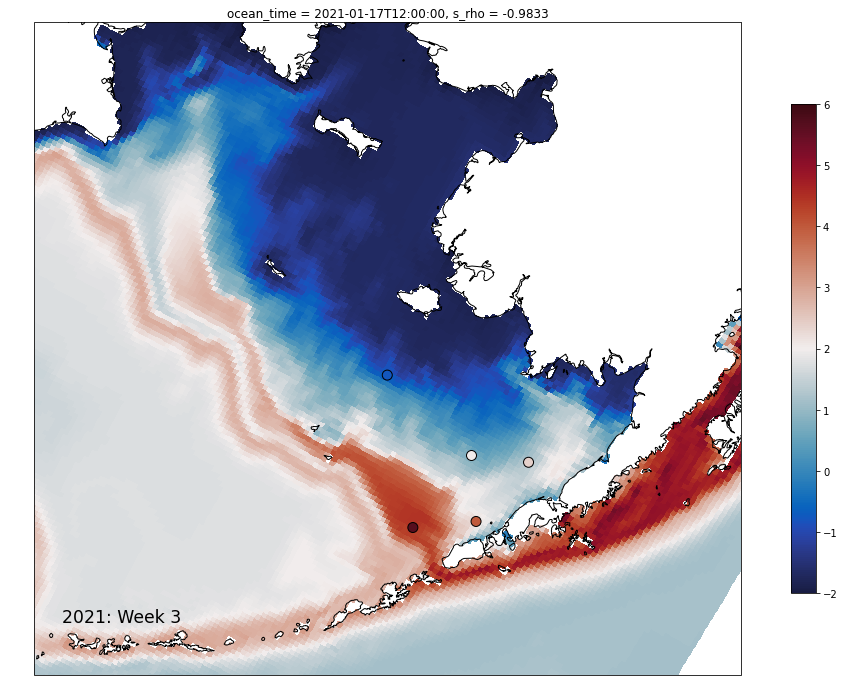

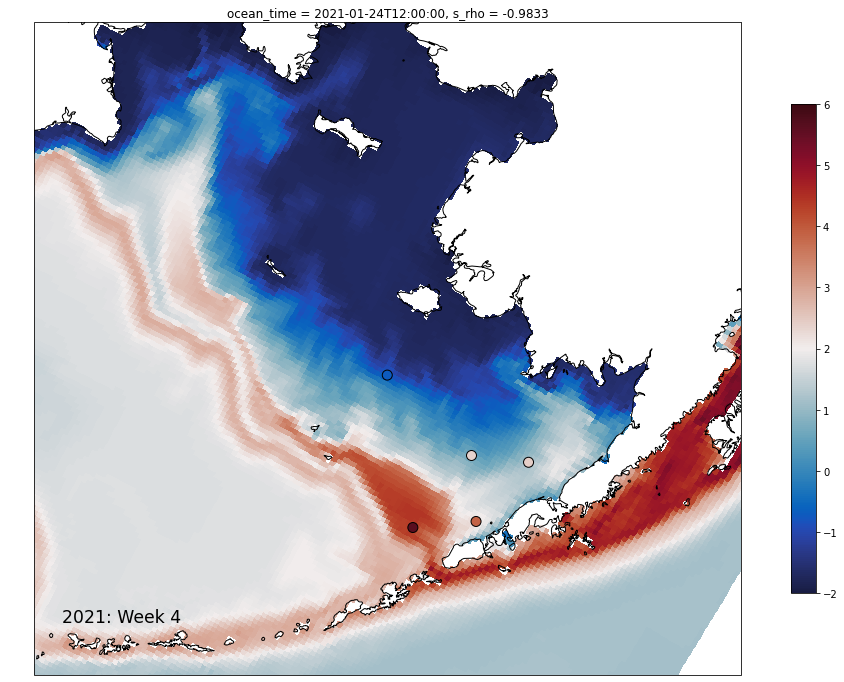

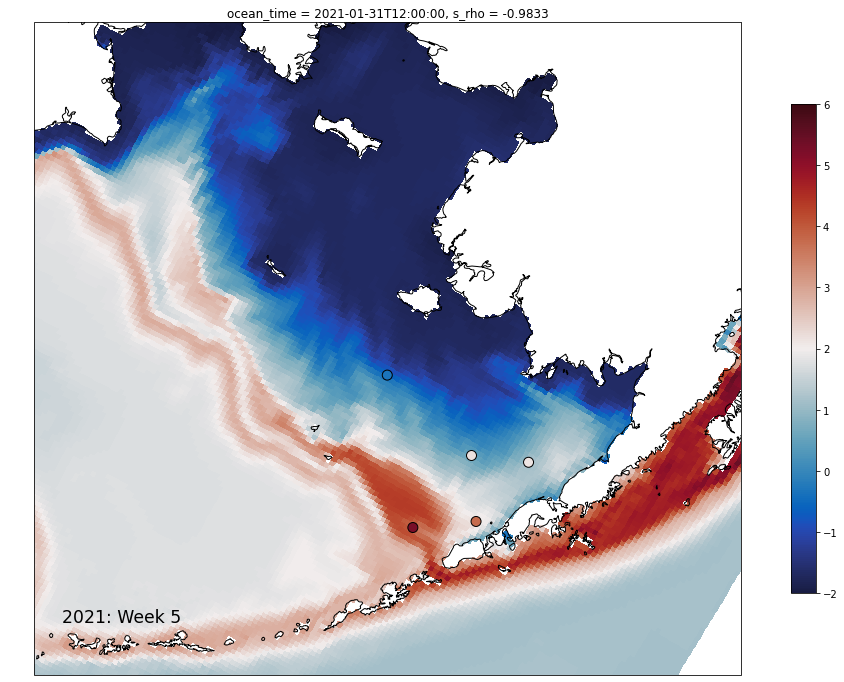

...

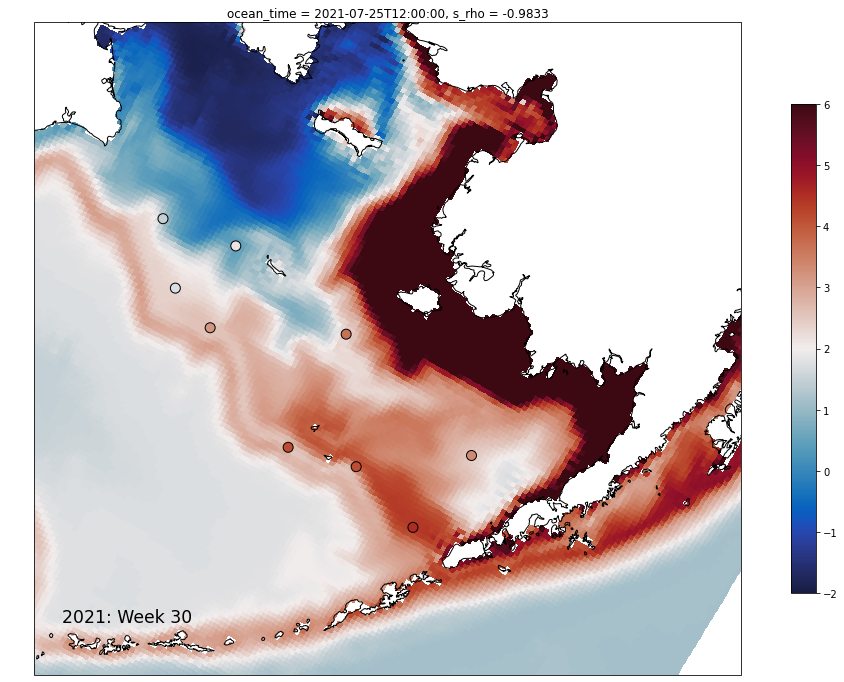

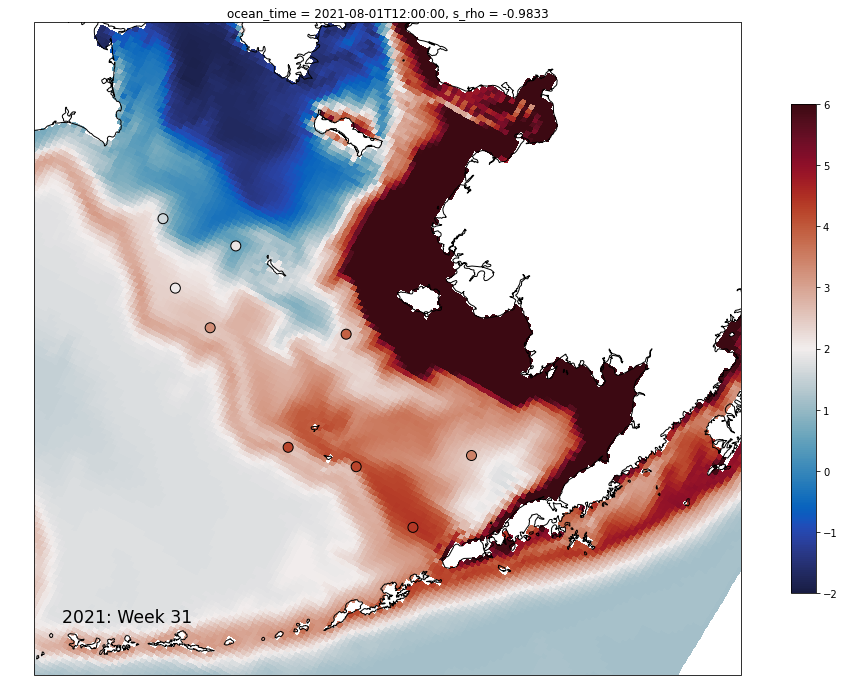

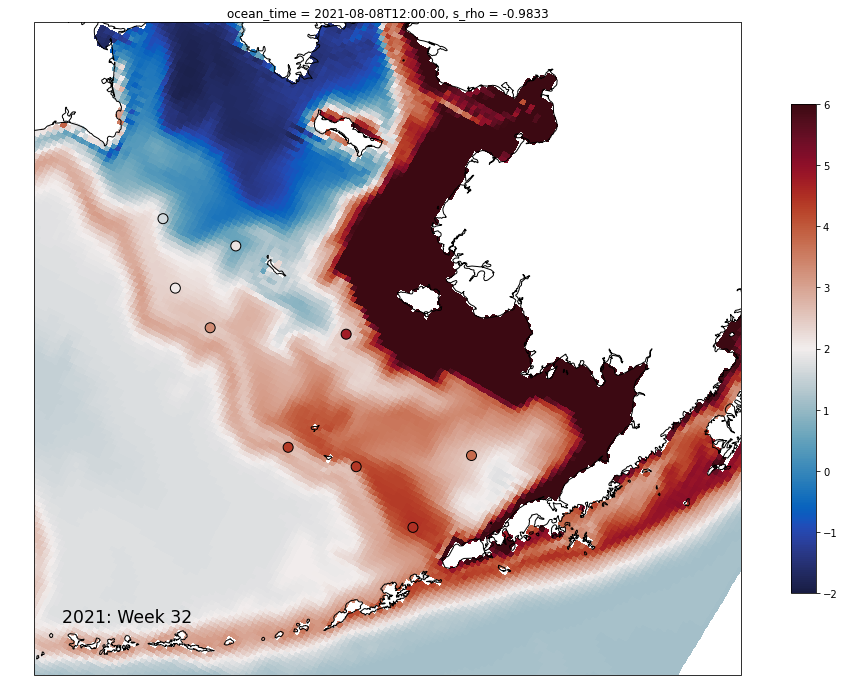

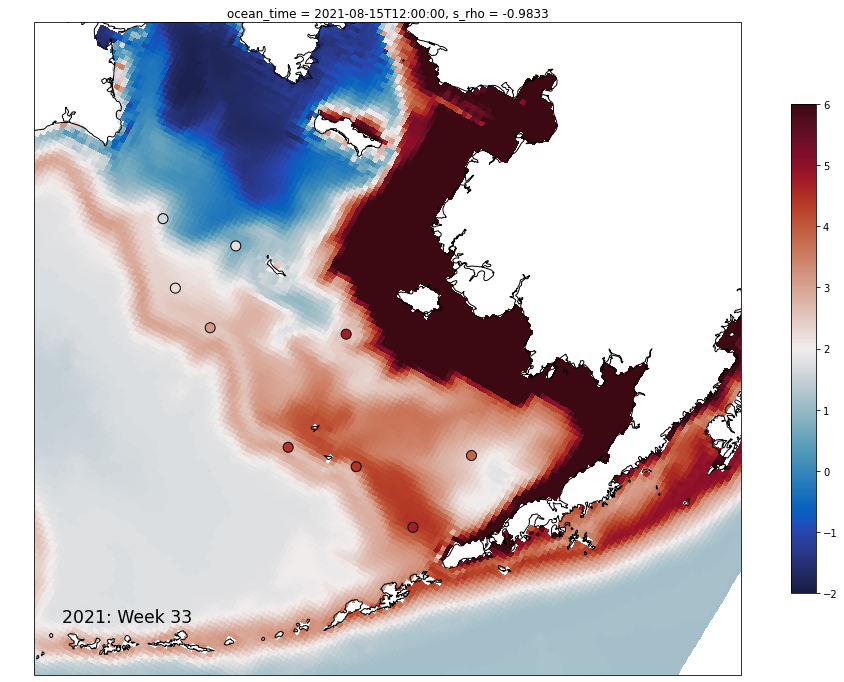

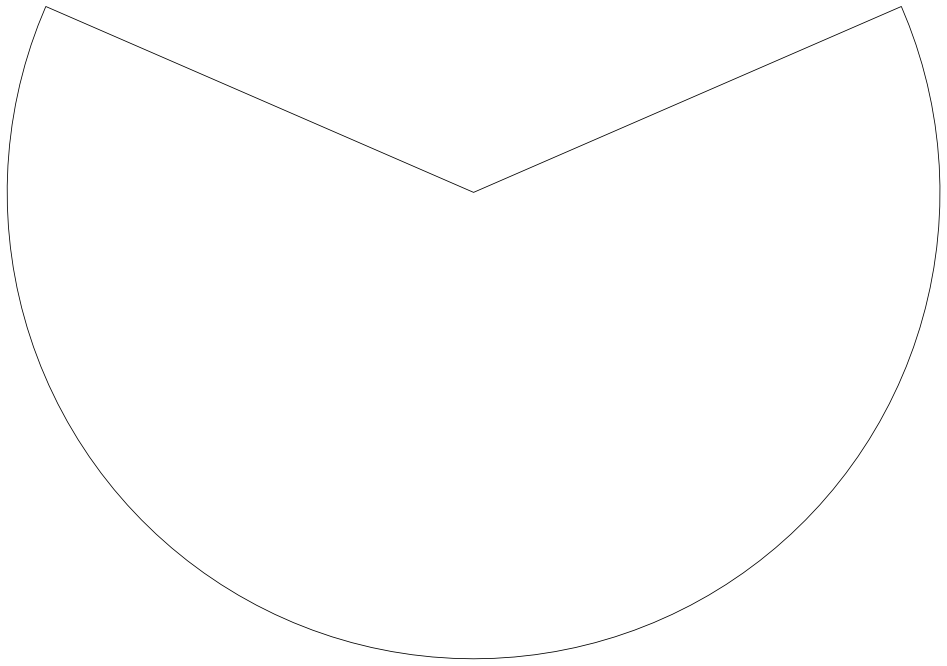

In [18]:
extent=[-179.5, -154, 52, 65]

map_proj = ccrs.LambertConformal(central_longitude=-160.0)

for wn in range(1,34):
    try:
        dftemp = weeklygroupbed.get_group(wn)
        dfplot = dftemp.groupby('timeseries_id').median()
    except:
        print("filling witn missing")
        dfplot = pd.DataFrame(data=[[dfplot.longitude.mean(), dfplot.latitude.mean(),np.nan]],columns=['longitude','latitude','sr_temp'])

    print(wn)

    fig,ax = make_map(projection=map_proj)

    hind = xdf_rho0.isel(ocean_time=slice(52+wn-1,52+wn))


    p = hind.temp[0,0,:,:].plot(
        transform=ccrs.PlateCarree(),  # the data's projection
        subplot_kws={"projection": map_proj},
        vmin=-2,vmax=6,cmap=cmocean.cm.balance,
        x='lon_rho',y='lat_rho',
        add_colorbar=False
    )



    if wn <= 17:
        c = ax.scatter(dfplot.longitude, dfplot.latitude, s=100, c=dfplot.sr_temp, edgecolors='k',
                   cmap=cmocean.cm.balance, vmin=-2, vmax=6, 
                   label=('2021: Week '+str(wn)),
                   transform=transformation)
        
        ax.scatter(dfmig.get_group(wn).median().longitude, dfmig.get_group(wn).median().latitude, s=100, c=dfmig.get_group(wn).median().temperature, edgecolors='k',
               cmap=cmocean.cm.balance, vmin=-2, vmax=6, 
               transform=transformation)
    else:
        wn = wn+1
        c = ax.scatter(dfplot.longitude, dfplot.latitude, s=100, c=dfplot.sr_temp, edgecolors='k',
                   cmap=cmocean.cm.balance, vmin=-2, vmax=6, 
                   label=('2021: Week '+str(wn)),
                   transform=transformation)
        ax.scatter(dfmig.get_group(1).median().longitude, dfmig.get_group(1).median().latitude, s=100, c=dfprig.get_group(wn).median().SB_Temp, edgecolors='k',
               cmap=cmocean.cm.balance, vmin=-2, vmax=6, 
               transform=transformation)            

    plt.colorbar(p,shrink=.75)
    ax.coastlines("10m", color="k")
    ax.set_extent(extent)

    l = plt.legend(loc='lower left', bbox_to_anchor=(-0.05, 0.05), fontsize='xx-large', fancybox=True, frameon=False, markerscale=0)

    for text in l.get_texts():
        text.set_color("black")    

    fig.savefig('Bio_PUFF_2021_week'+str(wn).zfill(2)+'.png',facecolor='white',dpi=300)

## Plot Timeseries of PUFs with Hindcast data

1040
1670
2010
2040
2560
3020
3350
3550
POPS0001
POPS0002
POPS0004
POPS0005
POPS0006
POPS0007
POPS0008
POPS0009
POPS0010


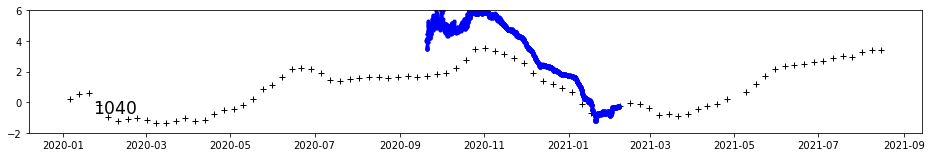

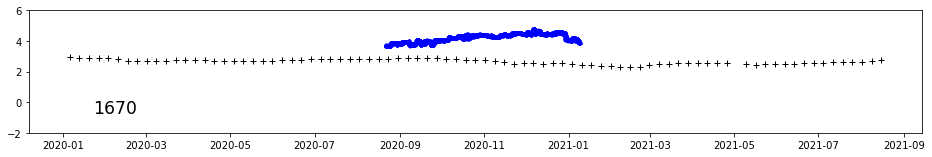

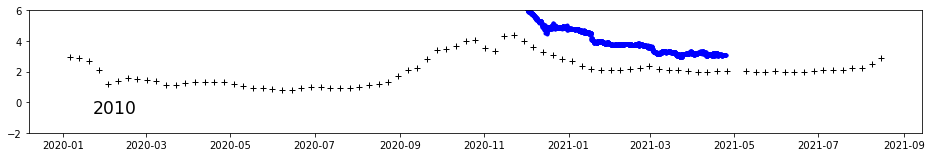

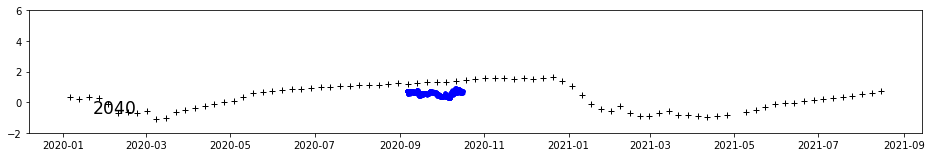

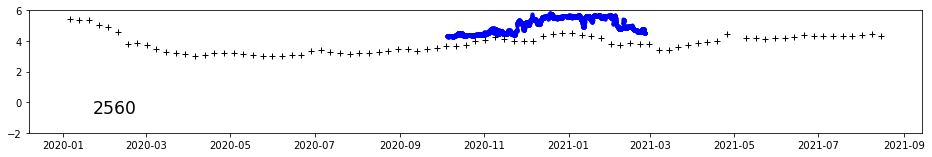

...

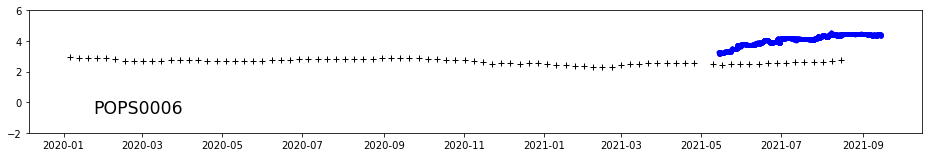

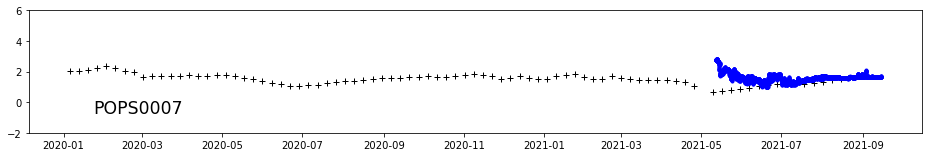

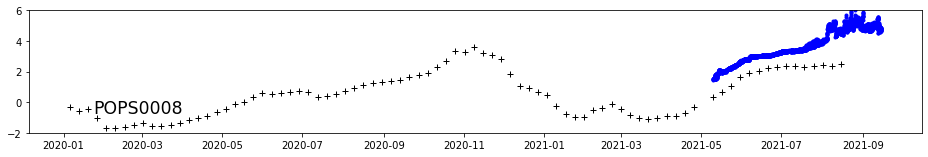

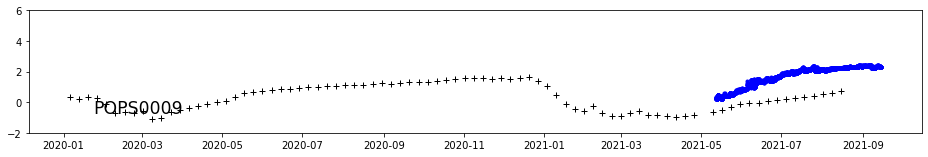

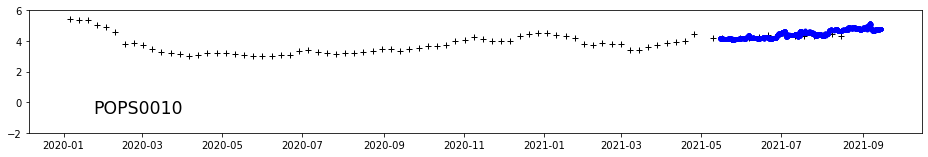

In [25]:

delta = .1

for i,groups in df_merged.groupby('timeseries_id'):
    print(i)
    fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(16,2.25), sharex=True)

    hindcast = (xdf_rho0.where((xdf_rho0.lat_rho < (groups.latitude[0] + delta)) &  (xdf_rho0.lat_rho > (groups.latitude[0] - delta)) & 
           (xdf_rho0.lon_rho > (groups.longitude[0]+360 - delta)) & (xdf_rho0.lon_rho < (groups.longitude[0]+360 + delta)), drop=True))
    # print(groups.sample(1))
    # print(hindcast)
    hindcast = hindcast.mean(dim=['eta_rho','xi_rho'])
    plt.plot(hindcast.ocean_time,hindcast.temp,'k+')
    
    if (i != 2010):
        if (i != 'POPS0006'):
            deepgroups = groups[groups['pressure']>1]
        else:
            deepgroups = groups.copy()
        plt.plot(deepgroups.index,deepgroups.sr_temp,'b.',label=i)
    else:
        deepgroups = groups[groups['pressure']<-1]
        plt.plot(deepgroups.index,deepgroups.sr_temp,'b.',label=i)
        
    plt.legend(loc='lower left', fontsize='xx-large', fancybox=True, frameon=False, markerscale=0)
       
        
    axes.set_ylim([-2,6])
    fig.savefig(f'images/{i}_vshindcast_fixed.png',facecolor='white',dpi=300)


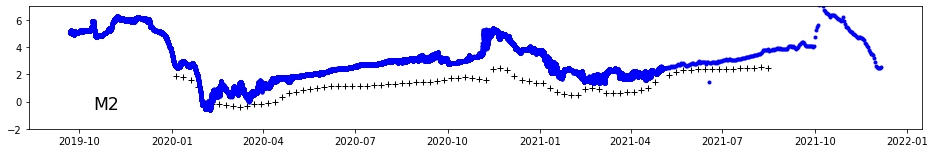

In [126]:
### do the same with m2
groups = dfmg #dfpr
prgroups = dfpr.resample('1D').median()

fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(16,2.25), sharex=True)

hindcast = (xdf_rho0.where((xdf_rho0.lat_rho < (groups.latitude[0] + delta)) &  (xdf_rho0.lat_rho > (groups.latitude[0] - delta)) & 
       (xdf_rho0.lon_rho > (groups.longitude[0]+360 - delta)) & (xdf_rho0.lon_rho < (groups.longitude[0]+360 + delta)), drop=True))
# print(groups.sample(1))
# print(hindcast)
hindcast = hindcast.mean(dim=['eta_rho','xi_rho'])
plt.plot(hindcast.ocean_time,hindcast.temp,'k+')


plt.plot(dfmg.index,dfmg.temperature,'b.',label='M2')
plt.plot(prgroups.index,prgroups.SB_Temp,'b.')

plt.legend(loc='lower left', fontsize='xx-large', fancybox=True, frameon=False, markerscale=0)


axes.set_ylim([-2,7])
fig.savefig(f'images/M2_vshindcast_fixed.png',facecolor='white',dpi=300)

In [118]:
dfpr

,SB_Depth,SB_Temp,Optode_Temp,weeks
time (UTC),,,,
2021-05-05 05:45:34+00:00,45.95,2.461,2.501,18
2021-05-05 06:03:37+00:00,45.25,2.478,2.500,18
2021-05-05 06:03:45+00:00,45.93,2.462,2.501,18
2021-05-05 06:20:53+00:00,45.61,2.604,2.501,18
2021-05-05 06:21:01+00:00,46.58,2.469,2.501,18
...,...,...,...,...
2021-12-06 12:28:00+00:00,45.43,2.563,2.761,49
2021-12-06 12:28:08+00:00,45.56,2.558,2.762,49
2021-12-06 15:04:44+00:00,45.26,2.593,2.807,49
